In [2]:
# Install PyTorch and Ultralytics YOLOv8 in Google Colab

# Install PyTorch (Colab typically already has it, but this ensures it's up to date)
!pip install -q torch torchvision torchaudio --upgrade

# Install Ultralytics YOLOv8
!pip install -q ultralytics --upgrade

# Confirm installation
import torch
import ultralytics
print("PyTorch version:", torch.__version__)
print("Ultralytics YOLO version:", ultralytics.__version__)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 821.2/821.2 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.1/393.1 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 95.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 72.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 52.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.0/571.0 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.2/200.2 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 52.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.2/158.2 MB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.6/216.6 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 201

In [ ]:
import zipfile
import os

# Path to your ZIP file
zip_path = "/content/test_dataset.zip"

# Extract directly into the current working directory
extract_to = "."  # or use "/content" explicitly

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f"✅ Unzipped '{zip_path}' to working directory")
print("📁 Contents:")
print(os.listdir(extract_to))


✅ Unzipped '/content/test_dataset.zip' to working directory
📁 Contents:
['.config', 'test_dataset', 'test_dataset.zip', 'sample_data']


In [6]:
# Install necessary dependencies
!pip install -q ultralytics
!pip install -q pycocotools

# ✅ Import necessary libraries
import torch
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from ultralytics import YOLO
from PIL import Image
import torchvision.transforms as T

# ✅ Load Faster R-CNN with pretrained COCO weights
faster_rcnn = fasterrcnn_resnet50_fpn(pretrained=True)
faster_rcnn.eval()
print("✅ Faster R-CNN loaded")

# ✅ Load YOLOv8 model
yolov8 = YOLO('yolov8n.pt')  # Change model as needed
print("✅ YOLOv8 loaded")

# ✅ Load DETR with pretrained weights
detr = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
detr.eval()
print("✅ DETR loaded")

# ✅ DETR-specific transform (required normalization)
detr_transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ Faster R-CNN loaded
✅ YOLOv8 loaded


Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


✅ DETR loaded


In [10]:
import torch

# Set the device (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move your DETR model to the device
detr = detr.to(device)  # Replace with your actual model variable name

In [ ]:
# Install dependencies (if not already)
!pip install -q pycocotools torchvision tqdm

import os
import json
import torch
from PIL import Image
from tqdm import tqdm
from torchvision import transforms
from pycocotools.coco import COCO

# ✅ DETR is loaded via torch.hub
detr = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
detr.eval()

# Set device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
detr.to(device)

# Paths
val_img_dir = '/content/data/val2017/val2017'
val_ann_file = '/content/data/annotations_trainval2017/annotations/instances_val2017.json'

# Load COCO ground truth
coco = COCO(val_ann_file)
image_ids = coco.getImgIds()

# ✅ DETR-specific preprocessing
transform = transforms.Compose([
    transforms.Resize(800),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

predictions = []

# Use only first 100 images for quick Colab testing (adjust as needed)
for img_id in tqdm(image_ids[:5000]):
    img_info = coco.loadImgs(img_id)[0]
    path = os.path.join(val_img_dir, img_info['file_name'])
    image = Image.open(path).convert('RGB')
    tensor = transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = detr(tensor)

    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > 0.3
    boxes = outputs['pred_boxes'][0, keep]
    scores = probas[keep].max(-1).values
    labels = probas[keep].argmax(-1)

# Sort by score and take top 20
    topk_indices = scores.argsort(descending=True)[:20]
    boxes = boxes[topk_indices]
    scores = scores[topk_indices]
    labels = labels[topk_indices]


    # Convert boxes from cxcywh to xyxy
    cx, cy, w, h = boxes.unbind(1)
    x1 = (cx - 0.5 * w) * image.width
    y1 = (cy - 0.5 * h) * image.height
    x2 = (cx + 0.5 * w) * image.width
    y2 = (cy + 0.5 * h) * image.height

    for i in range(len(keep.nonzero())):
        x, y, x2_, y2_ = x1[i].item(), y1[i].item(), x2[i].item(), y2[i].item()
        w_, h_ = x2_ - x, y2_ - y
        predictions.append({
            "image_id": img_id,
            "category_id": labels[i].item(),
            "bbox": [x, y, w_, h_],
            "score": scores[i].item()
        })

# Save results
with open('/content/data/detr_predictions.json', 'w') as f:
    json.dump(predictions, f)

print("Predictions saved to /content/detr_predictions.json")


Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main


loading annotations into memory...
Done (t=0.73s)
creating index...
index created!


100%|██████████| 5000/5000 [08:41<00:00,  9.58it/s]


Predictions saved to /content/detr_predictions.json


In [ ]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import numpy as np
import json

def compute_iou(boxA, boxB):
    xA, yA, wA, hA = boxA
    xB, yB, wB, hB = boxB
    boxA = [xA, yA, xA + wA, yA + hA]
    boxB = [xB, yB, xB + wB, yB + hB]

    xi1 = max(boxA[0], boxB[0])
    yi1 = max(boxA[1], boxB[1])
    xi2 = min(boxA[2], boxB[2])
    yi2 = min(boxA[3], boxB[3])

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    union_area = boxA_area + boxB_area - inter_area
    return inter_area / union_area if union_area else 0

def evaluate_model(gt_json_path, pred_json_path):
    print(f"⬆️ Using ground truth from: {gt_json_path}")
    print(f"⬆️ Using predictions from: {pred_json_path}")

    coco_gt = COCO(gt_json_path)
    coco_dt = coco_gt.loadRes(pred_json_path)

    coco_eval = COCOeval(coco_gt, coco_dt, iouType='bbox')
    coco_eval.evaluate()
    coco_eval.accumulate()
    coco_eval.summarize()

    # ➕ Per-category AP
    cat_ids = coco_gt.getCatIds()
    cat_id_to_name = {cat['id']: cat['name'] for cat in coco_gt.loadCats(cat_ids)}

    print("\n📊 Per-category AP (IoU=0.50:0.95):")
    for idx, cat_id in enumerate(cat_ids):
        coco_eval.params.catIds = [cat_id]
        coco_eval.evaluate()
        coco_eval.accumulate()
        ap = coco_eval.stats[0]  # AP@[0.5:0.95]
        print(f"  {cat_id_to_name[cat_id]:<20} AP = {ap:.3f}")

    # ➕ Custom Average IoU
    with open(pred_json_path, 'r') as f:
        predictions = json.load(f)
    predictions_by_img = {}
    for p in predictions:
        predictions_by_img.setdefault(p["image_id"], []).append(p)

    all_ious = []
    for img_id in coco_gt.getImgIds():
        gt_anns = coco_gt.loadAnns(coco_gt.getAnnIds(imgIds=[img_id], iscrowd=False))
        pred_anns = predictions_by_img.get(img_id, [])

        gt_boxes = [a['bbox'] for a in gt_anns]
        pred_boxes = [p['bbox'] for p in pred_anns]

        for pred_box in pred_boxes:
            ious = [compute_iou(pred_box, gt_box) for gt_box in gt_boxes]
            if ious:
                max_iou = max(ious)
                if max_iou > 0:
                    all_ious.append(max_iou)

    avg_iou = np.mean(all_ious) if all_ious else 0.0
    print(f"\n➡️ Average matched IoU (custom): {avg_iou:.4f}")
evaluate_model(
    "/content/data/annotations_trainval2017/annotations/instances_val2017.json",
    "/content/data/detr_predictions.json"
)



⬆️ Using ground truth from: /content/data/annotations_trainval2017/annotations/instances_val2017.json
⬆️ Using predictions from: /content/data/detr_predictions.json
loading annotations into memory...
Done (t=0.90s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.67s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=16.77s).
Accumulating evaluation results...
DONE (t=2.95s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.402
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.592
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.423
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.193
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.436
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.587
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | m

In [ ]:
import json

with open("/content/data/detr_predictions.json", "r") as f:
    preds = json.load(f)

for p in preds[:5]:
    print("Bbox:", p['bbox'], "Score:", p['score'])


Bbox: [231.8827667236328, 191.44281005859375, 128.27394104003906, 57.46852111816406] Score: 0.6288100481033325
Bbox: [134.71270751953125, 249.8267059326172, 19.323272705078125, 24.787368774414062] Score: 0.9810668230056763
Bbox: [489.68310546875, 201.37928771972656, 132.1075439453125, 137.8696746826172] Score: 0.952269434928894
Bbox: [501.4523620605469, 201.48583984375, 114.04983520507812, 27.273345947265625] Score: 0.6110146641731262
Bbox: [511.8099670410156, 43.97453689575195, 11.965911865234375, 46.678707122802734] Score: 0.7444908618927002


In [ ]:
!pip install -q pycocotools matplotlib opencv-python

from pycocotools.coco import COCO
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from collections import defaultdict

# ✅ Predefined paths (no upload required)
gt_path = "/content/data/annotations_trainval2017/annotations/instances_val2017.json"
pred_path = "/content/data/detr_predictions.json"
val_img_dir = "/content/data/val2017/val2017"

# ✅ Load ground truth and predictions
coco = COCO(gt_path)
with open(pred_path) as f:
    predictions = json.load(f)

# ✅ Group predictions by image_id
preds_by_img = defaultdict(list)
for ann in predictions:
    preds_by_img[ann['image_id']].append(ann)

# ✅ Function to compute IoU
def compute_iou(boxA, boxB):
    xA, yA, wA, hA = boxA
    xB, yB, wB, hB = boxB
    boxA = [xA, yA, xA + wA, yA + hA]
    boxB = [xB, yB, xB + wB, yB + hB]

    xi1 = max(boxA[0], boxB[0])
    yi1 = max(boxA[1], boxB[1])
    xi2 = min(boxA[2], boxB[2])
    yi2 = min(boxA[3], boxB[3])

    inter_area = max(0, xi2 - xi1) * max(0, yi2 - yi1)
    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    union_area = boxA_area + boxB_area - inter_area
    return inter_area / union_area if union_area else 0


loading annotations into memory...
Done (t=0.77s)
creating index...
index created!


In [ ]:
def show_image_with_boxes(image_id, iou_threshold=0.5, score_threshold=0.3):
    # ✅ Load image locally instead of from URL
    image_info = coco.loadImgs(image_id)[0]
    image_path = os.path.join("/content/data/val2017/val2017", image_info["file_name"])
    image = Image.open(image_path).convert("RGB")

    gt_anns = coco.loadAnns(coco.getAnnIds(imgIds=[image_id], iscrowd=False))
    pred_anns = [p for p in preds_by_img.get(image_id, []) if p['score'] >= score_threshold]

    # Category ID to name mapping
    cat_id_to_name = {cat['id']: cat['name'] for cat in coco.loadCats(coco.getCatIds())}

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    ax = plt.gca()

    # ✅ Draw ground truth boxes (green)
    for ann in gt_anns:
        x, y, w, h = ann['bbox']
        category_name = cat_id_to_name.get(ann['category_id'], "Unknown")
        ax.add_patch(plt.Rectangle((x, y), w, h, fill=False, edgecolor='green', linewidth=2))
        ax.text(x, y - 5, f"GT: {category_name}", color='green', fontsize=10, backgroundcolor='white')

    # ✅ Evaluate and draw predictions
    success = False
    for pred in pred_anns:
        best_iou = 0
        for gt in gt_anns:
            iou = compute_iou(pred['bbox'], gt['bbox'])
            best_iou = max(best_iou, iou)

        if best_iou >= iou_threshold:
            success = True

        x, y, w, h = pred['bbox']
        category_name = cat_id_to_name.get(pred['category_id'], "Unknown")
        color = 'blue' if best_iou >= iou_threshold else 'red'
        ax.add_patch(plt.Rectangle((x, y), w, h, fill=False, edgecolor=color, linewidth=2))
        ax.text(x, y + h + 5, f"Pred: {category_name} | IoU={best_iou:.2f}", color=color, fontsize=7, backgroundcolor='white')

    title = f"Image ID: {image_id} | {'✅ SUCCESS' if success else '❌ FAILURE'}"
    plt.title(title)
    plt.axis('off')
    plt.show()


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


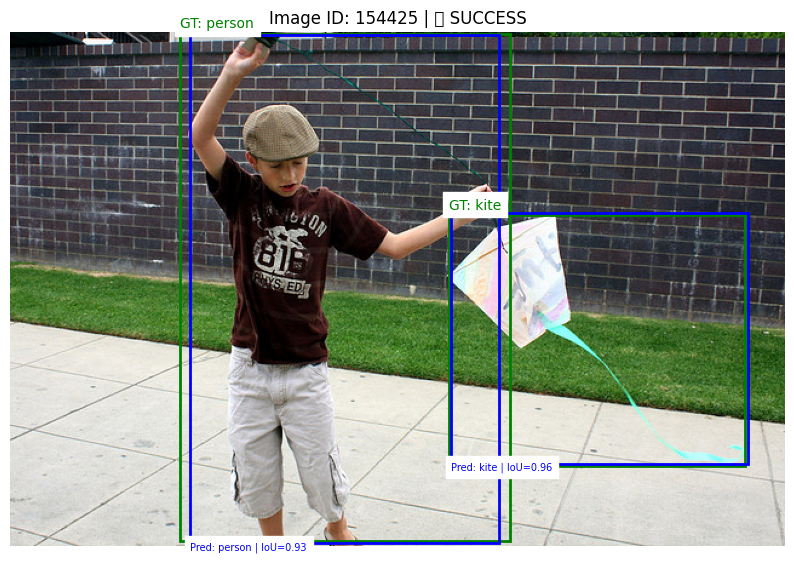

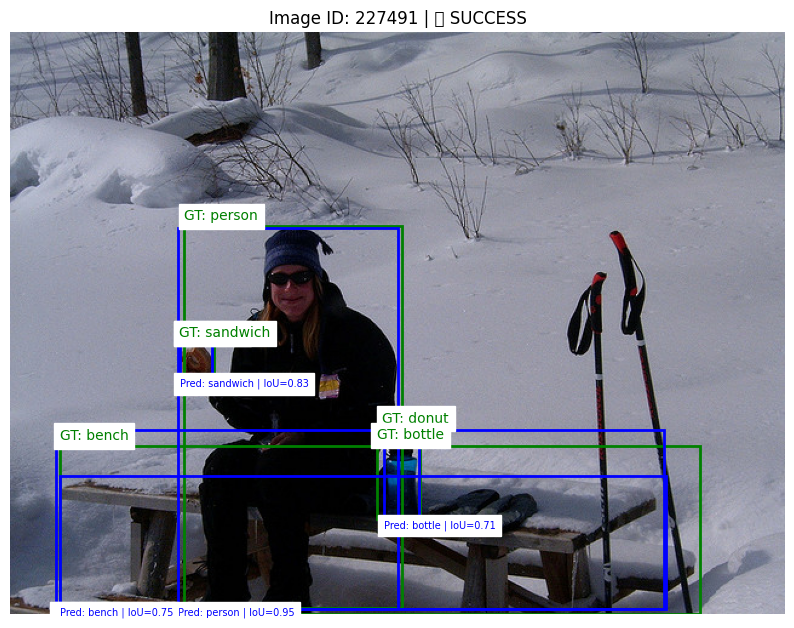

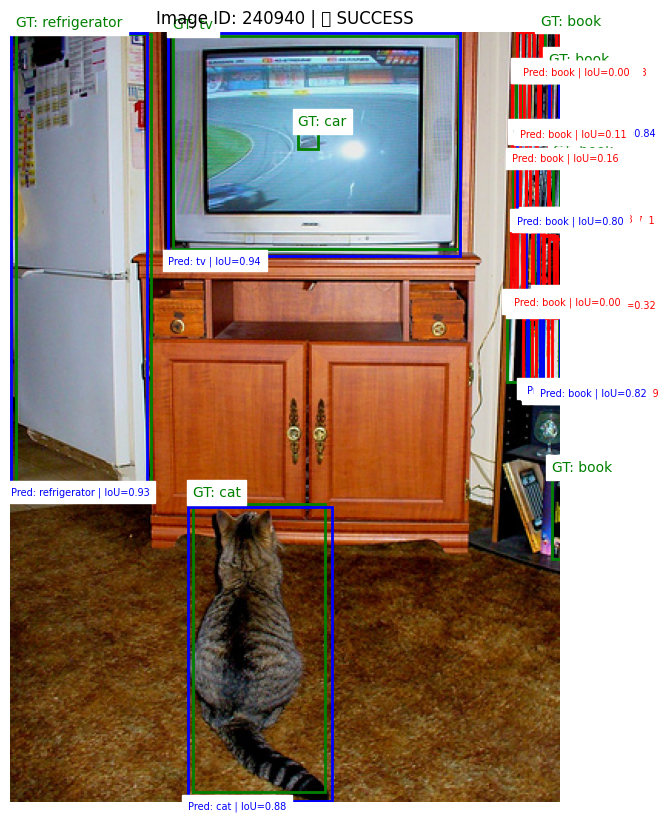

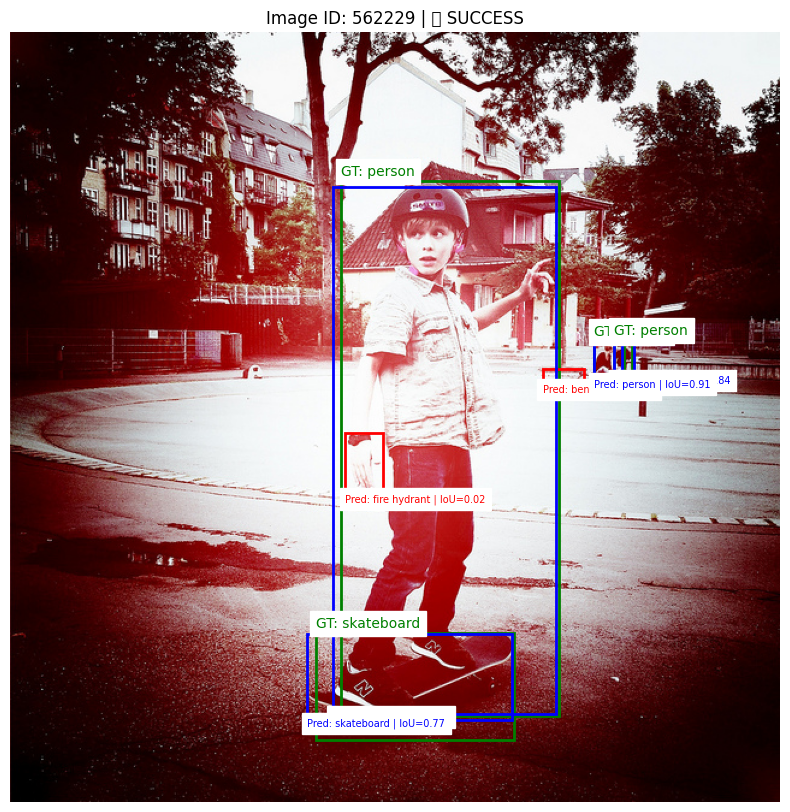

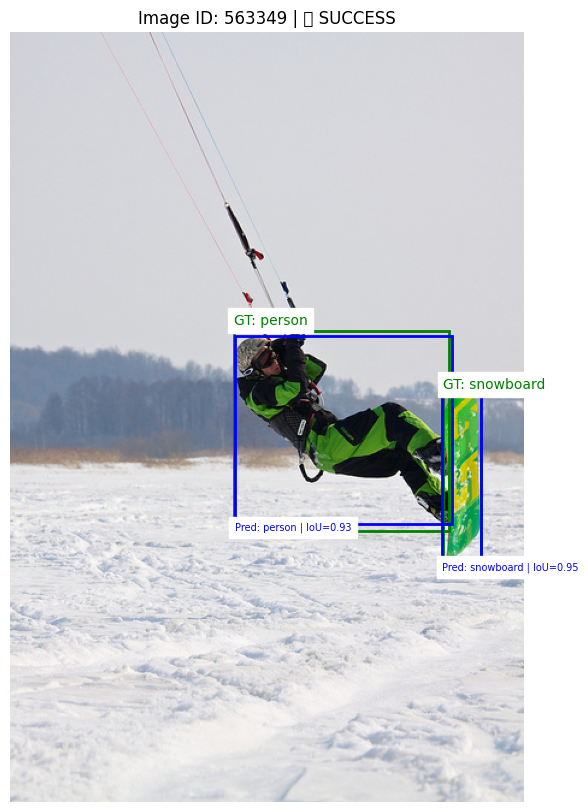

In [ ]:
# Only use image_ids that have predictions
import random

img_ids = list(preds_by_img.keys())
random.shuffle(img_ids)

# Visualize images with actual predictions
for img_id in img_ids[:5]:
    show_image_with_boxes(img_id, iou_threshold=0.5, score_threshold=0.3)


In [ ]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np

def register_hooks(model, layer_names):
    activations = {}

    def get_hook(name):
        def hook(module, input, output):
            activations[name] = output.detach()
        return hook

    for name, module in model.named_modules():
        if name in layer_names:
            module.register_forward_hook(get_hook(name))

    return activations


In [ ]:
def plot_feature_maps(activations, layer_names, num_maps=4):
    for layer in layer_names:
        fmap = activations[layer].squeeze(0)  # remove batch dimension
        num_channels = fmap.shape[0]

        plt.figure(figsize=(12, 4))
        for i in range(min(num_maps, num_channels)):
            plt.subplot(1, num_maps, i + 1)
            plt.imshow(fmap[i].cpu().numpy(), cmap='viridis')
            plt.axis('off')
            plt.title(f'{layer} [{i}]')
        plt.suptitle(f'Feature Maps from Layer: {layer}', fontsize=14)
        plt.tight_layout()
        plt.show()


In [ ]:
def visualize_feature_maps(model, image, layer_names):
    model.eval()

    # Register hooks and get activation dictionary
    activations = register_hooks(model, layer_names)

    # Preprocess image
    transform = T.Compose([
        T.Resize((224, 224)),
        T.ToTensor(),
    ])
    img_tensor = transform(image).unsqueeze(0)

    # Forward pass
    with torch.no_grad():
        _ = model(img_tensor)

    # Plot feature maps
    plot_feature_maps(activations, layer_names)


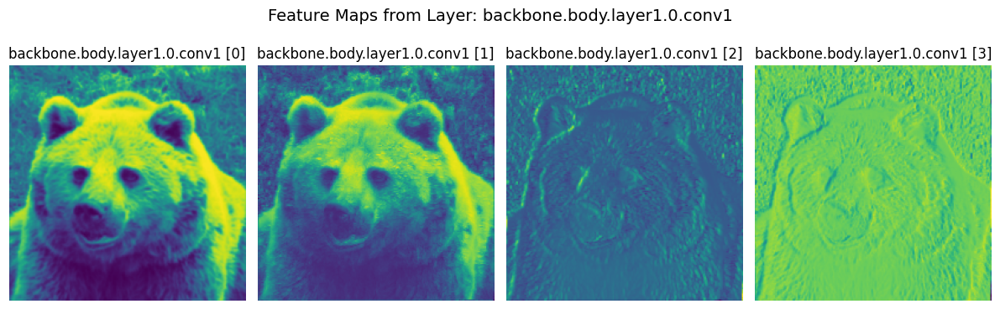

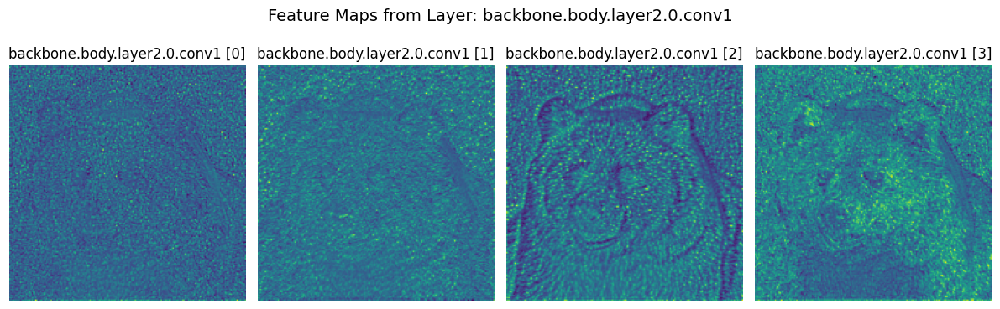

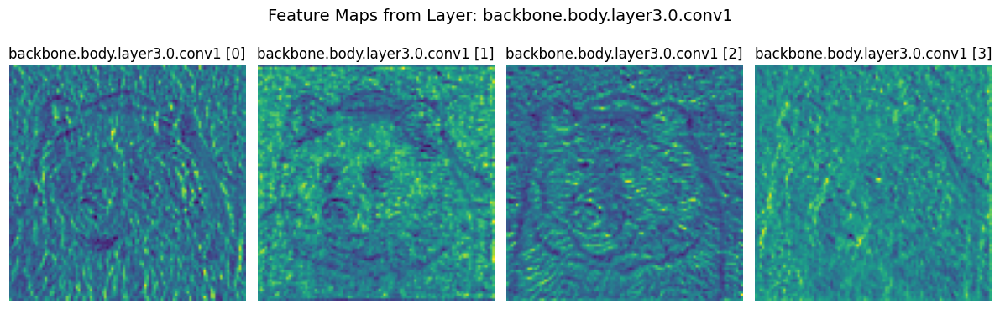

In [ ]:
import torchvision.models as models
from PIL import Image

# Load model and image
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
image = Image.open("/content/data/val2017/val2017/000000000285.jpg").convert("RGB")

# Choose 3 layer names from model.named_modules()
layer_names = [
    "backbone.body.layer1.0.conv1",
    "backbone.body.layer2.0.conv1",
    "backbone.body.layer3.0.conv1"
]

visualize_feature_maps(model, image, layer_names)


Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main


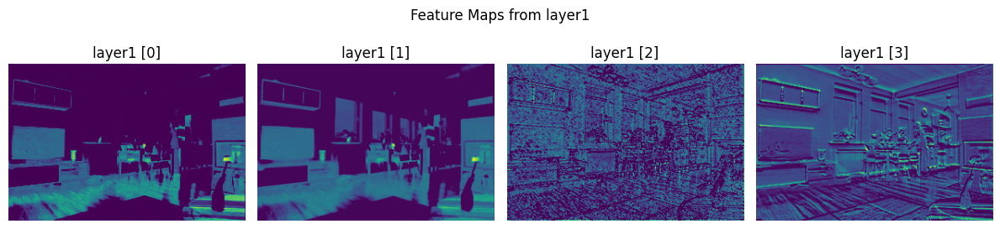

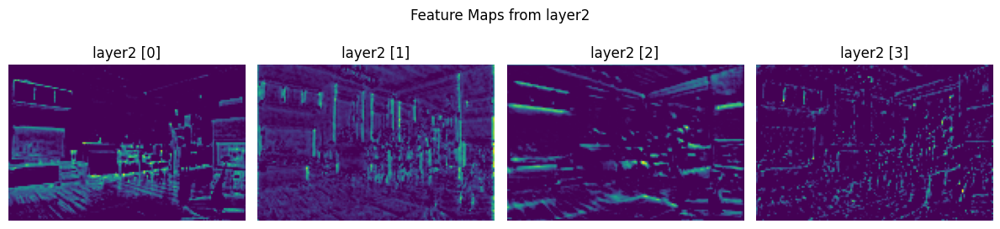

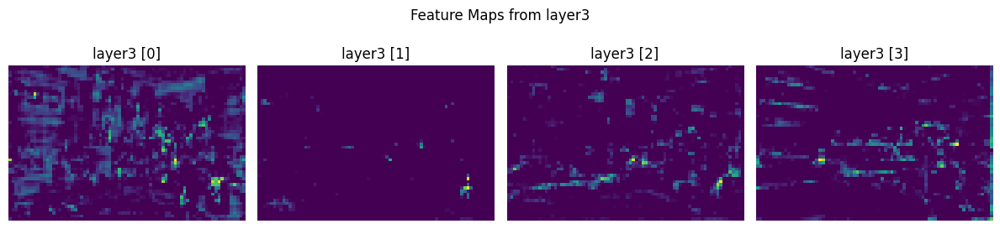

In [ ]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# ✅ Load DETR
detr = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
detr.eval()

# ✅ Transform
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# ✅ Load and preprocess image
image_path = "/content/data/val2017/val2017/000000000139.jpg"
image = Image.open(image_path).convert("RGB")
img_tensor = transform(image).unsqueeze(0)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
img_tensor = img_tensor.to(device)
detr = detr.to(device)

# ✅ Get the true ResNet50 backbone from DETR
resnet = detr.backbone[0].body  # ✅ FIXED: access the real resnet50 inside Joiner

# ✅ Storage for feature maps
feature_maps = {}

def save_feature(name):
    def hook_fn(module, input, output):
        feature_maps[name] = output.detach().cpu()
    return hook_fn

# ✅ Register hooks on 3 ResNet layers
resnet.layer1.register_forward_hook(save_feature("layer1"))
resnet.layer2.register_forward_hook(save_feature("layer2"))
resnet.layer3.register_forward_hook(save_feature("layer3"))

# ✅ Run forward pass (this will trigger the hooks)
with torch.no_grad():
    _ = detr(img_tensor)

# ✅ Show feature maps
def show_feature_map(tensor, layer_name, num_channels=4):
    fmap = tensor.squeeze(0)  # [C, H, W]
    num_channels = min(num_channels, fmap.shape[0])

    plt.figure(figsize=(num_channels * 3, 3))
    for i in range(num_channels):
        plt.subplot(1, num_channels, i + 1)
        plt.imshow(fmap[i], cmap="viridis")
        plt.title(f"{layer_name} [{i}]")
        plt.axis("off")
    plt.suptitle(f"Feature Maps from {layer_name}")
    plt.tight_layout()
    plt.show()

# ✅ Visualize all three layers
for layer in ["layer1", "layer2", "layer3"]:
    show_feature_map(feature_maps[layer], layer_name=layer, num_channels=4)


In [11]:
import torch  # Make sure this is imported

def predict_with_model(image, model_name):
    # Ensure the device is set
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    if model_name == 'fasterrcnn':
        transform = T.ToTensor()
        input_tensor = transform(image).unsqueeze(0).to(device)
        with torch.no_grad():
            outputs = faster_rcnn.to(device)(input_tensor)[0]
        preds = [{
            "bbox": box.tolist(),
            "score": score.item(),
            "category_id": int(label)
        } for box, score, label in zip(outputs["boxes"], outputs["scores"], outputs["labels"])]

    elif model_name == 'yolov8':
        results = yolov8(image)  # Assuming yolov8 model handles device internally
        preds = []
        for r in results:
            for box in r.boxes:
                x1, y1, x2, y2 = box.xyxy[0].tolist()
                w, h = x2 - x1, y2 - y1
                preds.append({
                    "bbox": [x1, y1, w, h],
                    "score": box.conf.item(),
                    "category_id": int(box.cls.item())
                })

    elif model_name == 'detr':
        transform = detr_transform  # Ensure this is defined earlier
        input_tensor = transform(image).unsqueeze(0).to(device)
        with torch.no_grad():
            outputs = detr.to(device)(input_tensor)
        probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
        keep = probas.max(-1).values > 0.5
        boxes = outputs['pred_boxes'][0, keep]
        scores = probas[keep].max(-1).values
        labels = probas[keep].argmax(-1)
        cx, cy, w, h = boxes.unbind(1)
        x1 = (cx - 0.5 * w) * image.width
        y1 = (cy - 0.5 * h) * image.height
        preds = []
        for i in range(len(scores)):
            preds.append({
                "bbox": [x1[i].item(), y1[i].item(), w[i].item() * image.width, h[i].item() * image.height],
                "score": scores[i].item(),
                "category_id": labels[i].item()
            })

    else:
        raise ValueError("Invalid model name")

    return preds


In [16]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt
import torch  # Make sure torch is imported

# Path to your test images
test_image_dir = '/content/test_dataset'

# Load image filenames
test_images = [f for f in os.listdir(test_image_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

# Map your own class IDs if needed (can be dummy for now)
cat_id_to_name = {i: f"class_{i}" for i in range(100)}  # Update if needed

def compare_models_on_custom_image(image_path, iou_threshold=0.5, score_threshold=0.3):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    image = Image.open(image_path).convert("RGB")
    models = ['yolov8', 'fasterrcnn', 'detr']

    # Use constrained_layout to avoid cutting off visuals
    fig, axs = plt.subplots(1, 3, figsize=(20, 8), constrained_layout=True)
    fig.suptitle(os.path.basename(image_path), fontsize=16)

    for idx, model_name in enumerate(models):
        ax = axs[idx]
        preds = predict_with_model(image, model_name)
        preds = [p for p in preds if p['score'] >= score_threshold]

        ax.imshow(image)
        success = False

        for pred in preds:
            x, y, w, h = pred['bbox']
            label = cat_id_to_name.get(pred['category_id'], "Unknown")
            color = 'blue'
            ax.add_patch(plt.Rectangle((x, y), w, h, fill=False, edgecolor=color, linewidth=2))
            ax.text(x, y + h + 5, f"{label} | score={pred['score']:.2f}",
                    color=color, fontsize=7, backgroundcolor='white')
            success = True

        # Ensure full image is visible
        ax.set_xlim([0, image.width])
        ax.set_ylim([image.height, 0])  # y-axis inverted for image coordinates
        ax.set_title(f"{model_name.upper()} {'✅' if success else '❌'}", fontsize=12)
        ax.axis('off')

    plt.show()



0: 416x640 1 person, 1 skis, 1 snowboard, 11.2ms
Speed: 1.8ms preprocess, 11.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


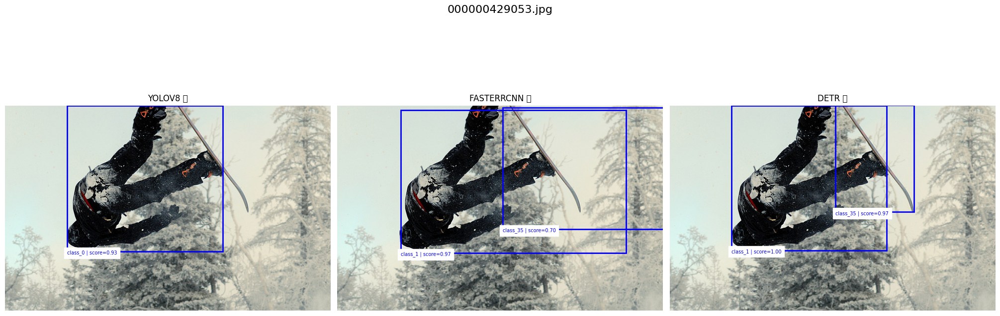


0: 448x640 1 sandwich, 2 oranges, 1 dining table, 9.4ms
Speed: 2.3ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


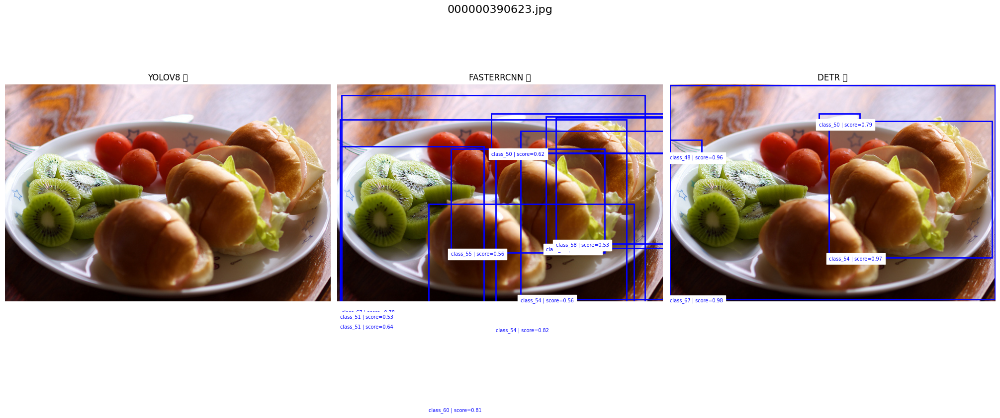


0: 544x640 2 persons, 1 couch, 4 remotes, 72.8ms
Speed: 3.8ms preprocess, 72.8ms inference, 1.8ms postprocess per image at shape (1, 3, 544, 640)


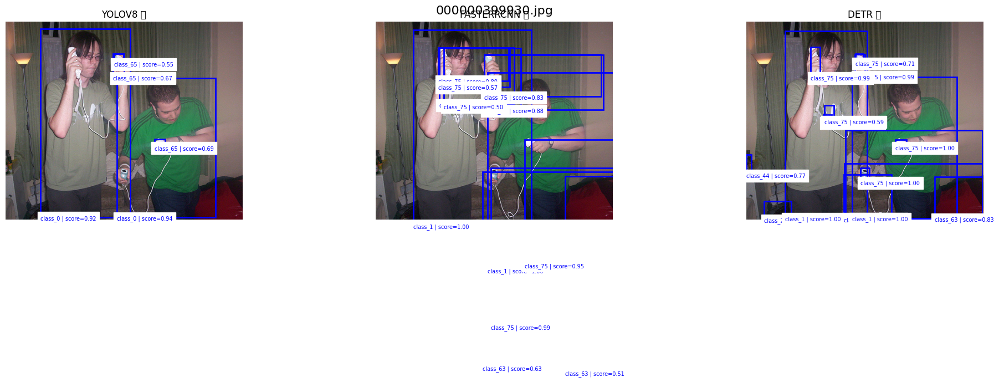


0: 448x640 2 elephants, 10.3ms
Speed: 3.2ms preprocess, 10.3ms inference, 2.6ms postprocess per image at shape (1, 3, 448, 640)


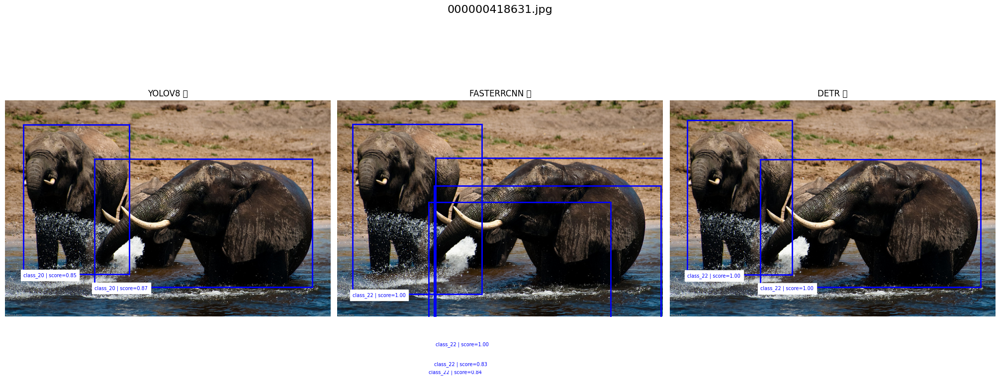


0: 480x640 1 person, 1 giraffe, 3 ties, 1 bottle, 9.7ms
Speed: 3.7ms preprocess, 9.7ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


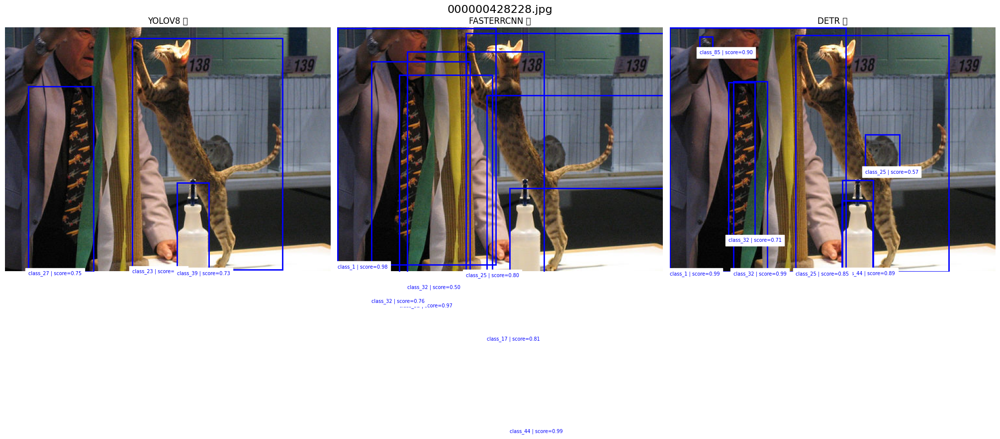

In [19]:
for img_file in random.sample(test_images, 5):
    full_path = os.path.join(test_image_dir, img_file)
    compare_models_on_custom_image(full_path,0.7,0.5)
